In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import torch
import torch.nn as nn
import torch.nn.functional as F

In [2]:
def generate_vortex_flow(size=224, strength=1.0, center=None):
    center = (size//2, size//2) if center is None else center
    x, y = np.meshgrid(np.arange(size) - center[0], np.arange(size) - center[1])
    r = np.sqrt(x**2 + y**2) + 1e-6
    u = -strength * y / r
    v = strength * x / r
    flow = np.stack([u, v], axis=-1)
    return flow

def generate_sink_flow(size=224, strength=1.0, center=None):
    center = (size//2, size//2) if center is None else center
    x, y = np.meshgrid(np.arange(size) - center[0], np.arange(size) - center[1])
    r = np.sqrt(x**2 + y**2) + 1e-6
    u = -strength * x / r
    v = -strength * y / r
    flow = np.stack([u, v], axis=-1)
    return flow

def generate_uniform_flow(size=224, angle=45):
    angle_rad = np.radians(angle)
    u = np.cos(angle_rad) * np.ones((size, size))
    v = np.sin(angle_rad) * np.ones((size, size))
    flow = np.stack([u, v], axis=-1)
    return flow

def generate_complex_flow(size=224):
    vortex1 = generate_vortex_flow(size, strength=1.0, center=(size//3, size//3))
    vortex2 = generate_vortex_flow(size, strength=-0.7, center=(2*size//3, 2*size//3))
    sink = generate_sink_flow(size, strength=1.0, center=(2*size//3, size//3))
    uniform = generate_uniform_flow(size, angle=30)
    flow = 0.4 * vortex1 + 0.3 * vortex2 + 0.2 * sink + 0.1 * uniform
    return flow

In [3]:
def plot_flow_field(flow, density=20, title="Flow Field"):
    plt.figure(figsize=(10, 10))
    
    colors = [(0, 0, 0.5), (0, 0.5, 1), (1, 1, 1), (1, 0.5, 0), (0.5, 0, 0)]
    cmap = LinearSegmentedColormap.from_list('flow_cmap', colors, N=100)
    
    u, v = flow[..., 0], flow[..., 1]
    magnitude = np.sqrt(u**2 + v**2)
    
    plt.imshow(magnitude, cmap=cmap, origin='lower')
    plt.colorbar(label='Velocity Magnitude')
    
    size = flow.shape[0]
    step = size // density
    y, x = np.mgrid[:size:step, :size:step]
    u_sub = u[::step, ::step]
    v_sub = v[::step, ::step]
    
    plt.quiver(x, y, u_sub, v_sub, 
               angles='xy', scale_units='xy', scale=0.1,
               color='black', width=0.003, 
               headwidth=4, headlength=5, headaxislength=3)
    
    plt.title(title)
    plt.tight_layout()
        
    plt.show()

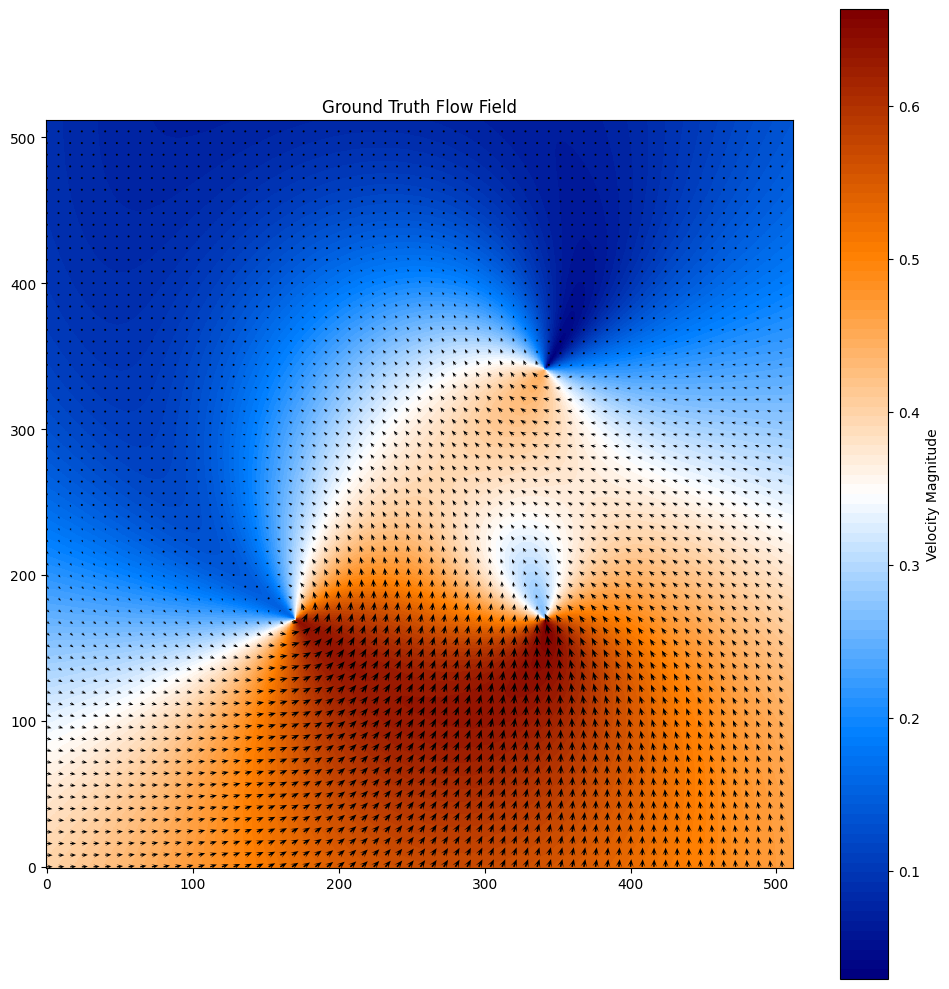

In [4]:
SIZE = 512
flow = generate_complex_flow(SIZE)
plot_flow_field(flow, SIZE // 8, "Ground Truth Flow Field")

In [5]:
class ODE(nn.Module):
	def __init__(self, input_dim, hidden_dims):
		super(ODE, self).__init__()
		dim_list = [input_dim] + list(hidden_dims) + [input_dim]
		layers = []
		for i in range(len(dim_list) - 1):
			layers.append(nn.Linear(dim_list[i], dim_list[i + 1]))
			if i < len(dim_list) - 2:
				layers.append(nn.ReLU())
		self.mlp = nn.Sequential(*layers)
	
	def forward(self, x):
		x = self.mlp(x)
		return x

In [6]:
def fit_flow_field(ode, flow_field, coordinates):
    optim = torch.optim.Adam(ode.parameters(), lr=1e-3, weight_decay=0)
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optim, gamma=0.999)

    for epoch in range(10000):
        estimated_flow_field = ode(coordinates)

        loss = F.mse_loss(flow_field, estimated_flow_field)
        if epoch == 0 or (epoch < 1000 and (epoch + 1) % 100 == 0) or (epoch + 1) % 1000 == 0:
            print(f'Epoch {epoch+1}, Loss: {loss}')

        optim.zero_grad()
        loss.backward()
        optim.step()
        scheduler.step()

    return estimated_flow_field

In [7]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [8]:
y_coords = torch.arange(SIZE).view(1, SIZE, 1).expand(SIZE, SIZE, 1)
x_coords = torch.arange(SIZE).view(SIZE, 1, 1).expand(SIZE, SIZE, 1)
coordinate_tensor = torch.cat([x_coords, y_coords], dim=2)
coordinate_tensor = coordinate_tensor.float()
coordinate_tensor = coordinate_tensor.to(device)

In [9]:
flow_tensor = torch.FloatTensor(flow)
flow_tensor = flow_tensor.to(device)
ode = ODE(2, (256 for _ in range(3))).to(device)
estimated_flow_tensor = fit_flow_field(ode, flow_tensor, coordinate_tensor)

Epoch 1, Loss: 219.28610229492188
Epoch 100, Loss: 0.033370863646268845
Epoch 200, Loss: 0.024536730721592903
Epoch 300, Loss: 0.013516541570425034
Epoch 400, Loss: 0.012129302136600018
Epoch 500, Loss: 0.010942785069346428
Epoch 600, Loss: 0.010097038000822067
Epoch 700, Loss: 0.009364280849695206
Epoch 800, Loss: 0.008460902608931065
Epoch 900, Loss: 0.0077957166358828545
Epoch 1000, Loss: 0.007253814488649368
Epoch 2000, Loss: 0.0043115816079080105
Epoch 3000, Loss: 0.0033501768484711647
Epoch 4000, Loss: 0.0029891938902437687
Epoch 5000, Loss: 0.0028311070054769516
Epoch 6000, Loss: 0.002755075925961137
Epoch 7000, Loss: 0.0027205883525311947
Epoch 8000, Loss: 0.0027049409691244364
Epoch 9000, Loss: 0.0026980172842741013
Epoch 10000, Loss: 0.0026950458995997906


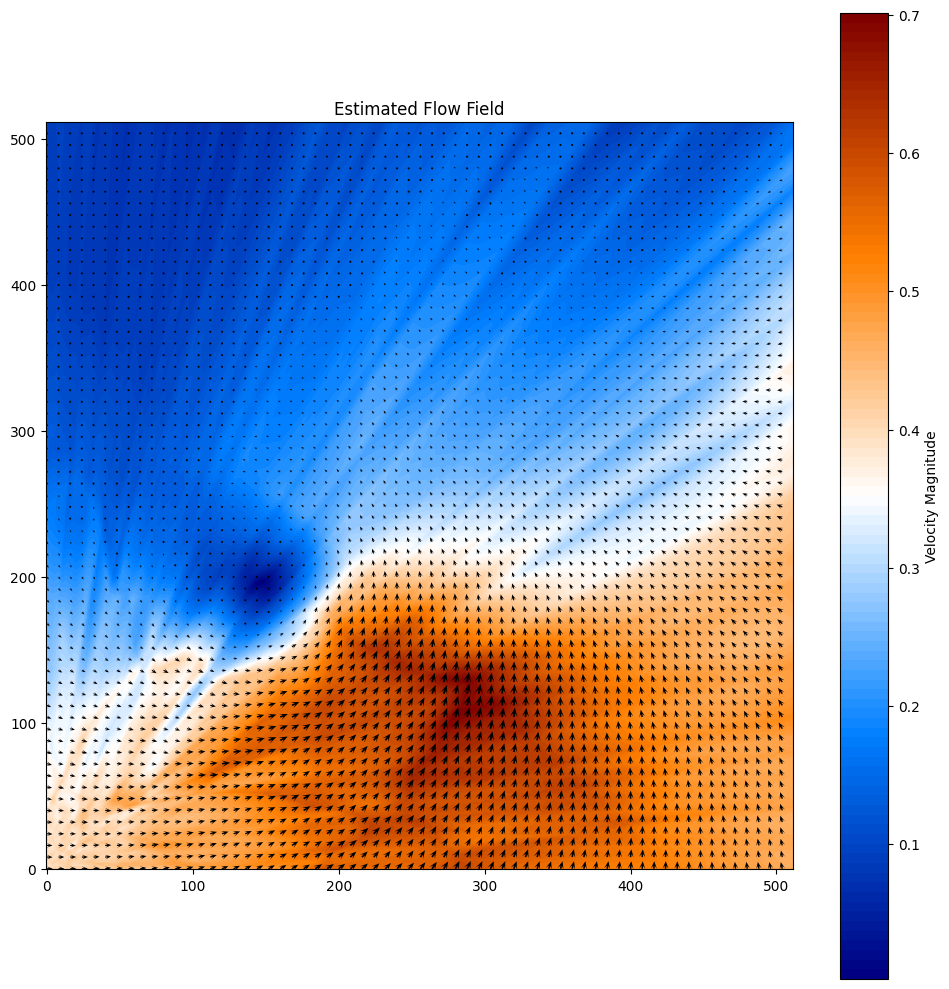

In [10]:
estimated_flow = estimated_flow_tensor.detach().cpu().numpy()
plot_flow_field(estimated_flow, SIZE // 8, "Estimated Flow Field")

In [11]:
class FourierFeatureODE(nn.Module):
    def __init__(self, input_dim, hidden_dims, fourier_scale=10.0, num_fourier_features=10, random_features=False):
        super(FourierFeatureODE, self).__init__()
        
        self.input_dim = input_dim
        self.num_fourier_features = num_fourier_features
        
        self.random_features = random_features
        self.register_buffer('B', torch.randn(input_dim, num_fourier_features) * fourier_scale)
        
        fourier_expanded_dim = input_dim + 2 * num_fourier_features
        dim_list = [fourier_expanded_dim] + list(hidden_dims) + [input_dim]
        layers = []
        for i in range(len(dim_list) - 1):
            layers.append(nn.Linear(dim_list[i], dim_list[i + 1]))
            if i < len(dim_list) - 2:
                layers.append(nn.ReLU())
        self.mlp = nn.Sequential(*layers)
    
    # Fourier Features Let Networks Learn High Frequency Functions in Low Dimensional Domains style
    def compute_random_fourier_features(self, x):
        x_proj = torch.matmul(x, self.B)
        sin_features = torch.sin(2 * np.pi * x_proj)
        cos_features = torch.cos(2 * np.pi * x_proj)
        fourier_features = torch.cat([x, sin_features, cos_features], dim=-1)
        return fourier_features
    
    # NeRF/Transformer style
    def compute_positional_fourier_features(self, x):
        encodings = [x]
        for i in range(self.num_fourier_features // 2):
            freq = 2.0 ** i
            sin_features = torch.sin(freq * x)
            cos_features = torch.cos(freq * x)
            encodings.append(sin_features)
            encodings.append(cos_features)
        return torch.cat(encodings, dim=-1)

    def forward(self, x):
        x_fourier = self.compute_random_fourier_features(x) if self.random_features else self.compute_positional_fourier_features(x)
        output = self.mlp(x_fourier)
        return output

In [12]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126).to(device)
estimated_flow_tensor_ff = fit_flow_field(ode, flow_tensor, coordinate_tensor)

Epoch 1, Loss: 1.1548042297363281
Epoch 100, Loss: 0.009301425889134407
Epoch 200, Loss: 0.001806371146813035
Epoch 300, Loss: 0.0009846086613833904
Epoch 400, Loss: 0.0006685064290650189
Epoch 500, Loss: 0.0005188034265302122
Epoch 600, Loss: 0.0004094761097803712
Epoch 700, Loss: 0.00034658543881960213
Epoch 800, Loss: 0.00030075793620198965
Epoch 900, Loss: 0.00026655883993953466
Epoch 1000, Loss: 0.00023858346685301512
Epoch 2000, Loss: 0.000127519597299397
Epoch 3000, Loss: 9.72634443314746e-05
Epoch 4000, Loss: 8.497391536366194e-05
Epoch 5000, Loss: 7.911483407951891e-05
Epoch 6000, Loss: 7.615067443111911e-05
Epoch 7000, Loss: 7.464378722943366e-05
Epoch 8000, Loss: 7.3903203883674e-05
Epoch 9000, Loss: 7.355492562055588e-05
Epoch 10000, Loss: 7.339899457292631e-05


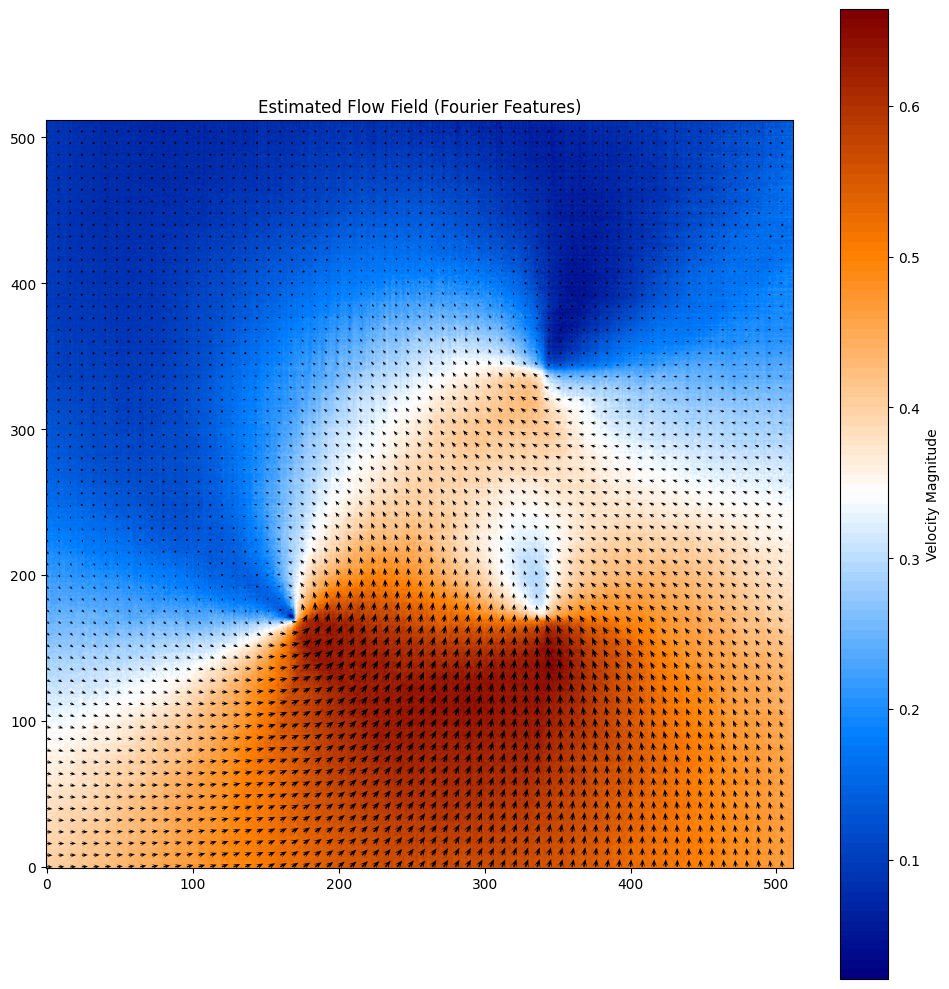

In [13]:
estimated_flow_ff = estimated_flow_tensor_ff.detach().cpu().numpy()
plot_flow_field(estimated_flow_ff, SIZE // 8, "Estimated Flow Field (Fourier Features)")

In [14]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126, random_features=True).to(device)
estimated_flow_tensor_rff = fit_flow_field(ode, flow_tensor, coordinate_tensor)

Epoch 1, Loss: 1.8397928476333618
Epoch 100, Loss: 0.009964436292648315
Epoch 200, Loss: 0.003683896502479911
Epoch 300, Loss: 0.0025703106075525284
Epoch 400, Loss: 0.002111980691552162
Epoch 500, Loss: 0.0017832121811807156
Epoch 600, Loss: 0.001639175578020513
Epoch 700, Loss: 0.0014781897189095616
Epoch 800, Loss: 0.001274490961804986
Epoch 900, Loss: 0.0011580727295950055
Epoch 1000, Loss: 0.0010735284304246306
Epoch 2000, Loss: 0.0005858532967977226
Epoch 3000, Loss: 0.0004171636828687042
Epoch 4000, Loss: 0.00034637845237739384
Epoch 5000, Loss: 0.00031333588412962854
Epoch 6000, Loss: 0.00029731960967183113
Epoch 7000, Loss: 0.00028971658321097493
Epoch 8000, Loss: 0.00028627371648326516
Epoch 9000, Loss: 0.0002847619471140206
Epoch 10000, Loss: 0.0002841122623067349


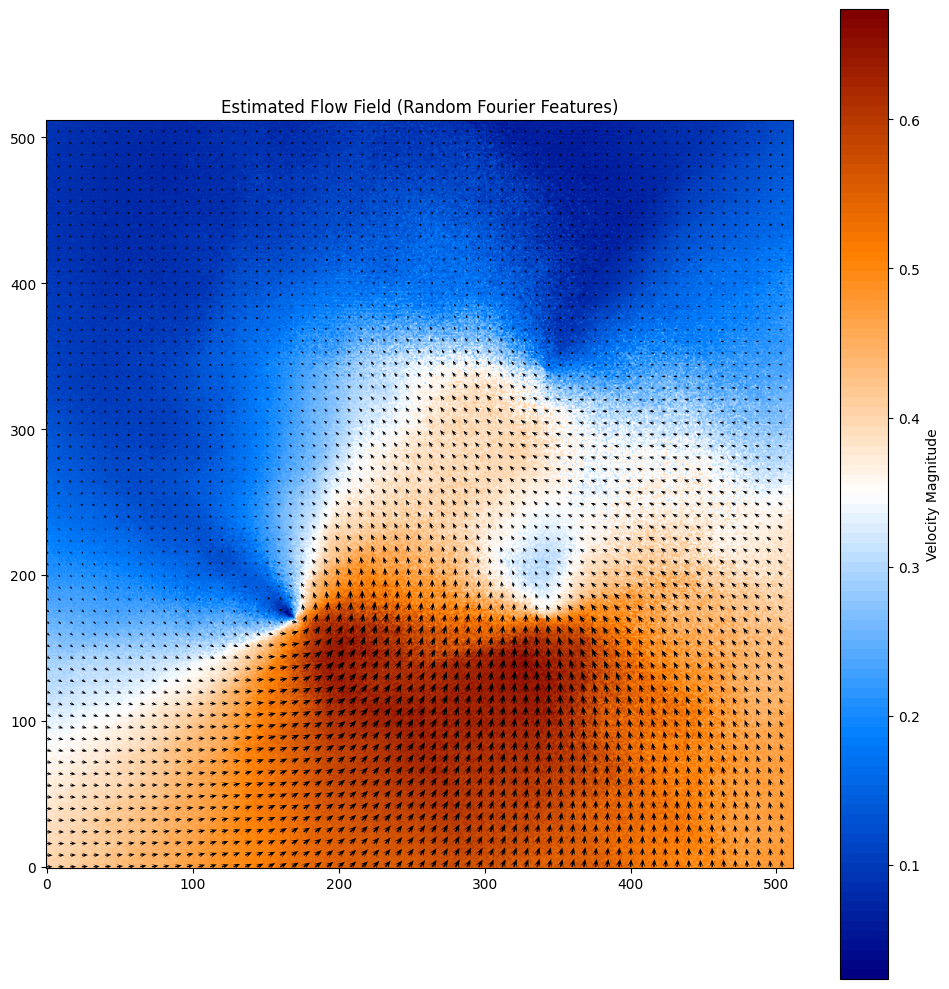

In [15]:
estimated_flow_rff = estimated_flow_tensor_rff.detach().cpu().numpy()
plot_flow_field(estimated_flow_rff, SIZE // 8, "Estimated Flow Field (Random Fourier Features)")

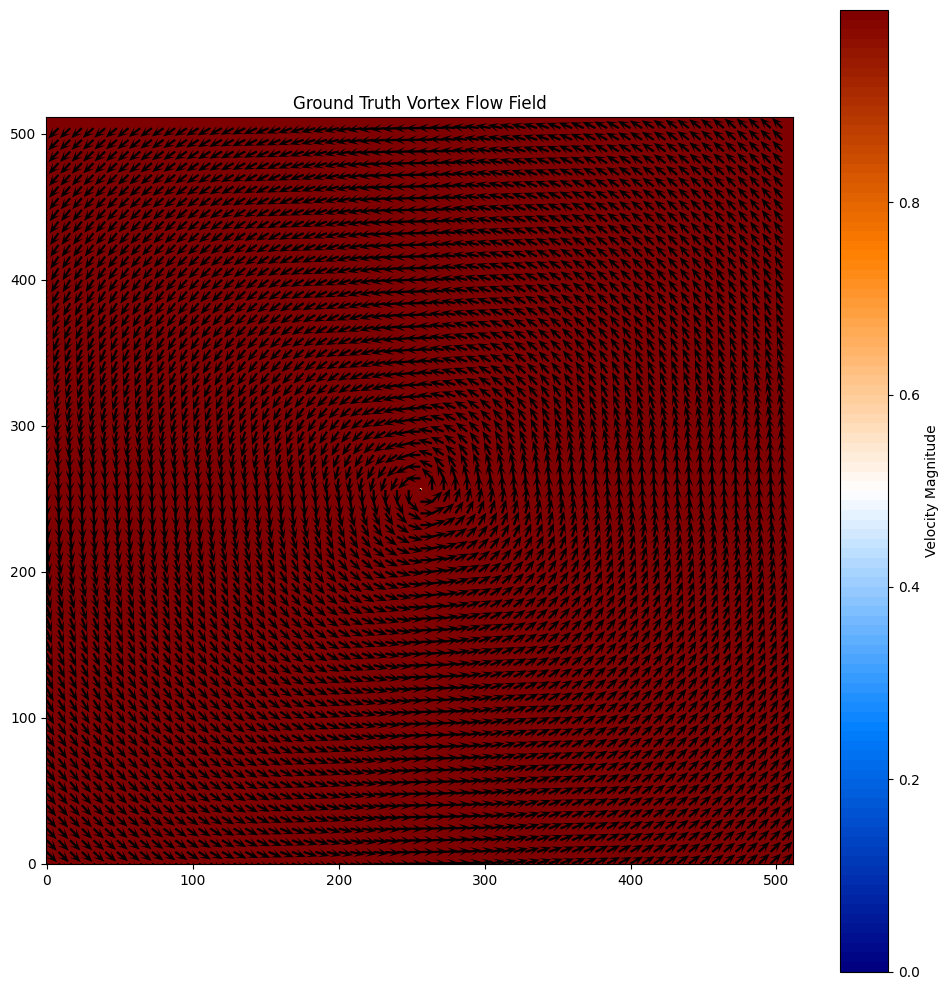

In [16]:
vortex_flow = generate_vortex_flow(SIZE)
plot_flow_field(vortex_flow, SIZE // 8, "Ground Truth Vortex Flow Field")

In [17]:
vortex_flow_tensor = torch.FloatTensor(vortex_flow)
vortex_flow_tensor = vortex_flow_tensor.to(device)
ode = ODE(2, (256 for _ in range(3))).to(device)
estimated_vortex_flow_tensor = fit_flow_field(ode, vortex_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 217.12506103515625
Epoch 100, Loss: 0.20715004205703735
Epoch 200, Loss: 0.16156277060508728
Epoch 300, Loss: 0.09939880669116974
Epoch 400, Loss: 0.0519845113158226
Epoch 500, Loss: 0.03947799652814865
Epoch 600, Loss: 0.037279799580574036
Epoch 700, Loss: 0.03329289332032204
Epoch 800, Loss: 0.031188584864139557
Epoch 900, Loss: 0.029459461569786072
Epoch 1000, Loss: 0.027515674009919167
Epoch 2000, Loss: 0.013994227163493633
Epoch 3000, Loss: 0.010672151111066341
Epoch 4000, Loss: 0.008971355855464935
Epoch 5000, Loss: 0.008398824371397495
Epoch 6000, Loss: 0.008093000389635563
Epoch 7000, Loss: 0.007938173599541187
Epoch 8000, Loss: 0.007860266603529453
Epoch 9000, Loss: 0.00782119669020176
Epoch 10000, Loss: 0.007801753003150225


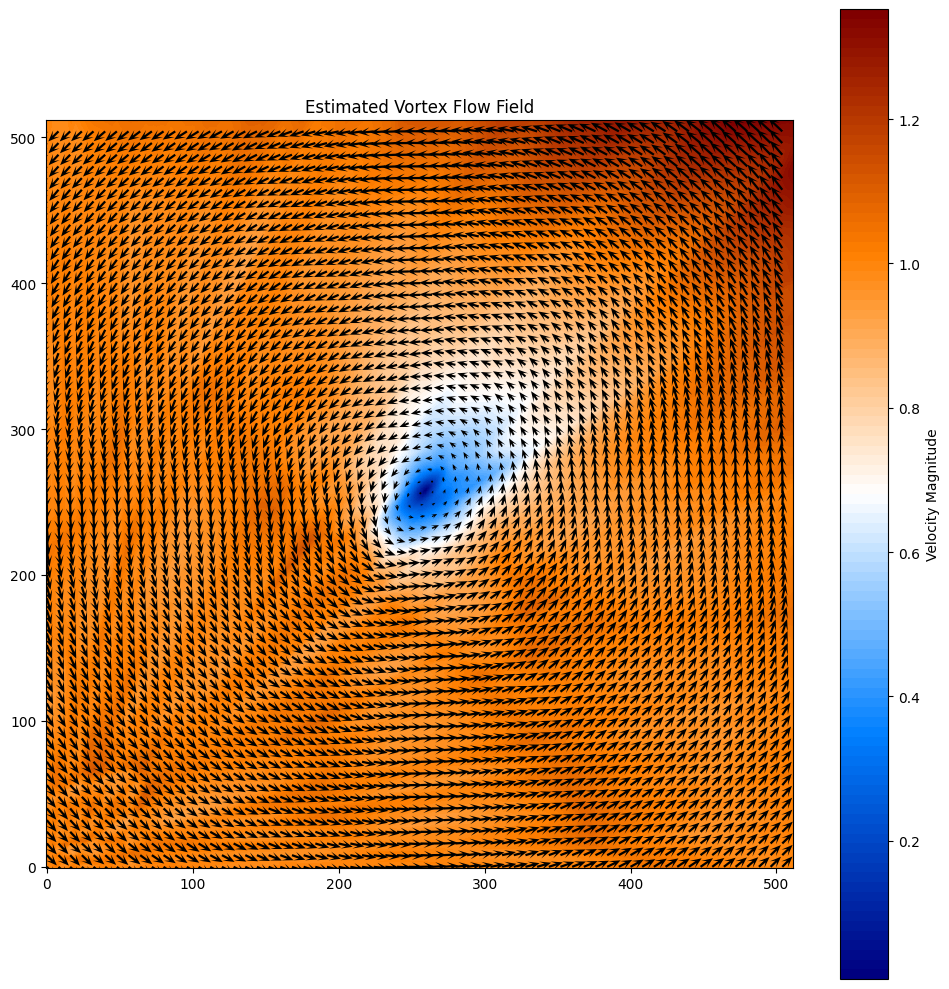

In [18]:
estimated_vortex_flow = estimated_vortex_flow_tensor.detach().cpu().numpy()
plot_flow_field(estimated_vortex_flow, SIZE // 8, "Estimated Vortex Flow Field")

In [19]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126).to(device)
estimated_vortex_flow_tensor_ff = fit_flow_field(ode, vortex_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 1.1106936931610107
Epoch 100, Loss: 0.02754475176334381
Epoch 200, Loss: 0.009281467646360397
Epoch 300, Loss: 0.004740860313177109
Epoch 400, Loss: 0.002622435335069895
Epoch 500, Loss: 0.001832435722462833
Epoch 600, Loss: 0.001441112020984292
Epoch 700, Loss: 0.001149960095062852
Epoch 800, Loss: 0.0009978869929909706
Epoch 900, Loss: 0.0008962841238826513
Epoch 1000, Loss: 0.0008144683670252562
Epoch 2000, Loss: 0.00048773427261039615
Epoch 3000, Loss: 0.0003910361265297979
Epoch 4000, Loss: 0.0003485261113382876
Epoch 5000, Loss: 0.00032732548424974084
Epoch 6000, Loss: 0.0003162478096783161
Epoch 7000, Loss: 0.0003104971256107092
Epoch 8000, Loss: 0.00030760999652557075
Epoch 9000, Loss: 0.00030624051578342915
Epoch 10000, Loss: 0.0003056221758015454


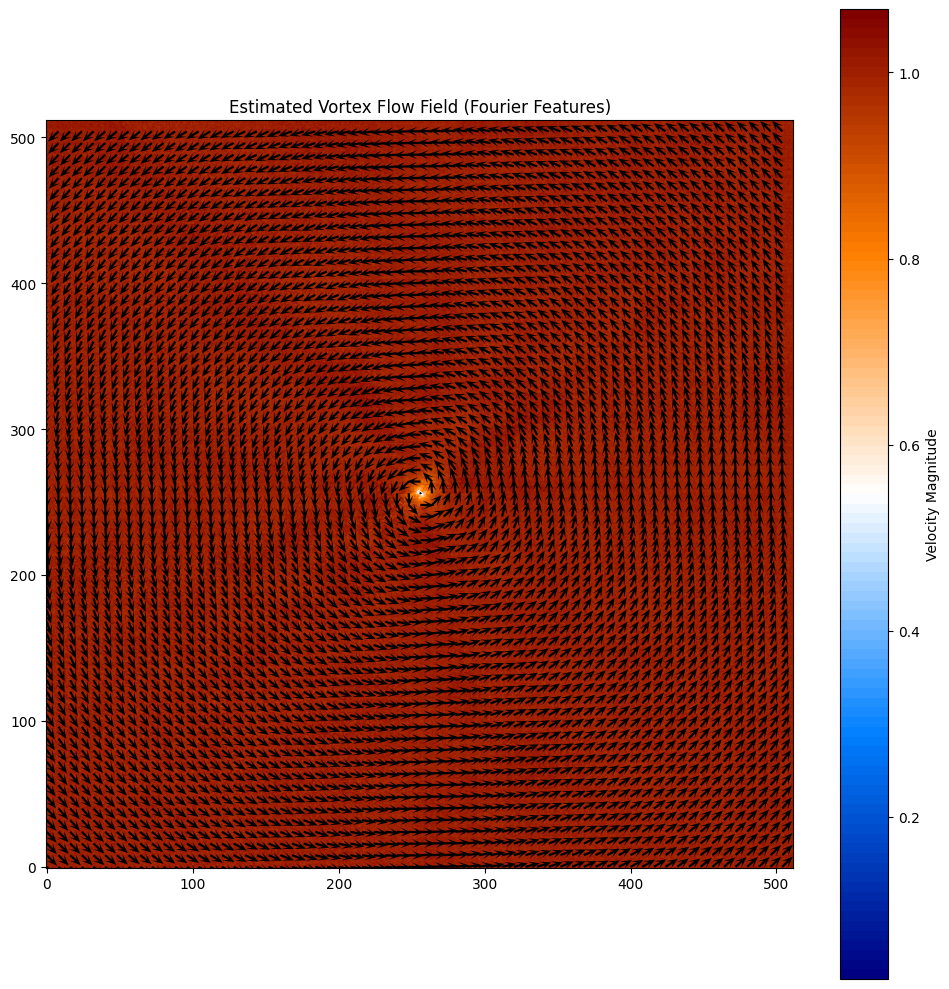

In [20]:
estimated_vortex_flow_ff = estimated_vortex_flow_tensor_ff.detach().cpu().numpy()
plot_flow_field(estimated_vortex_flow_ff, SIZE // 8, "Estimated Vortex Flow Field (Fourier Features)")

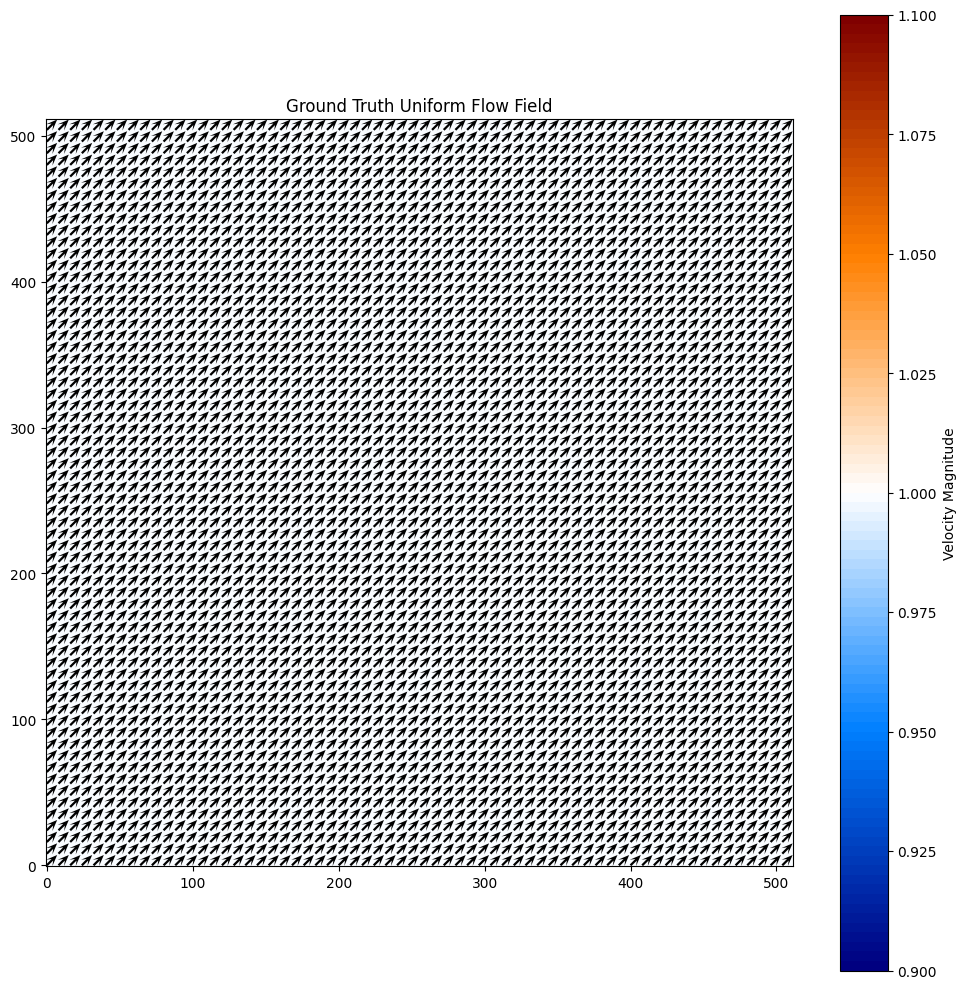

In [21]:
uniform_flow = generate_uniform_flow(SIZE)
plot_flow_field(uniform_flow, SIZE // 8, "Ground Truth Uniform Flow Field")

In [22]:
uniform_flow_tensor = torch.FloatTensor(uniform_flow)
uniform_flow_tensor = uniform_flow_tensor.to(device)
ode = ODE(2, (256 for _ in range(3))).to(device)
estimated_uniform_flow_tensor = fit_flow_field(ode, uniform_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 330.45458984375
Epoch 100, Loss: 0.059023428708314896
Epoch 200, Loss: 0.04357066750526428
Epoch 300, Loss: 0.005667555145919323
Epoch 400, Loss: 0.0018986365757882595
Epoch 500, Loss: 0.0004626917652785778
Epoch 600, Loss: 0.0003199867787770927
Epoch 700, Loss: 0.00029702583560720086
Epoch 800, Loss: 0.00016902037896215916
Epoch 900, Loss: 0.00014520637341775
Epoch 1000, Loss: 0.00013074965681880713
Epoch 2000, Loss: 8.080023690126836e-05
Epoch 3000, Loss: 6.647891132161021e-05
Epoch 4000, Loss: 5.9983431128785014e-05
Epoch 5000, Loss: 5.679301102645695e-05
Epoch 6000, Loss: 5.514052463695407e-05
Epoch 7000, Loss: 5.42946727364324e-05
Epoch 8000, Loss: 5.387274723034352e-05
Epoch 9000, Loss: 5.366607001633383e-05
Epoch 10000, Loss: 5.356662586564198e-05


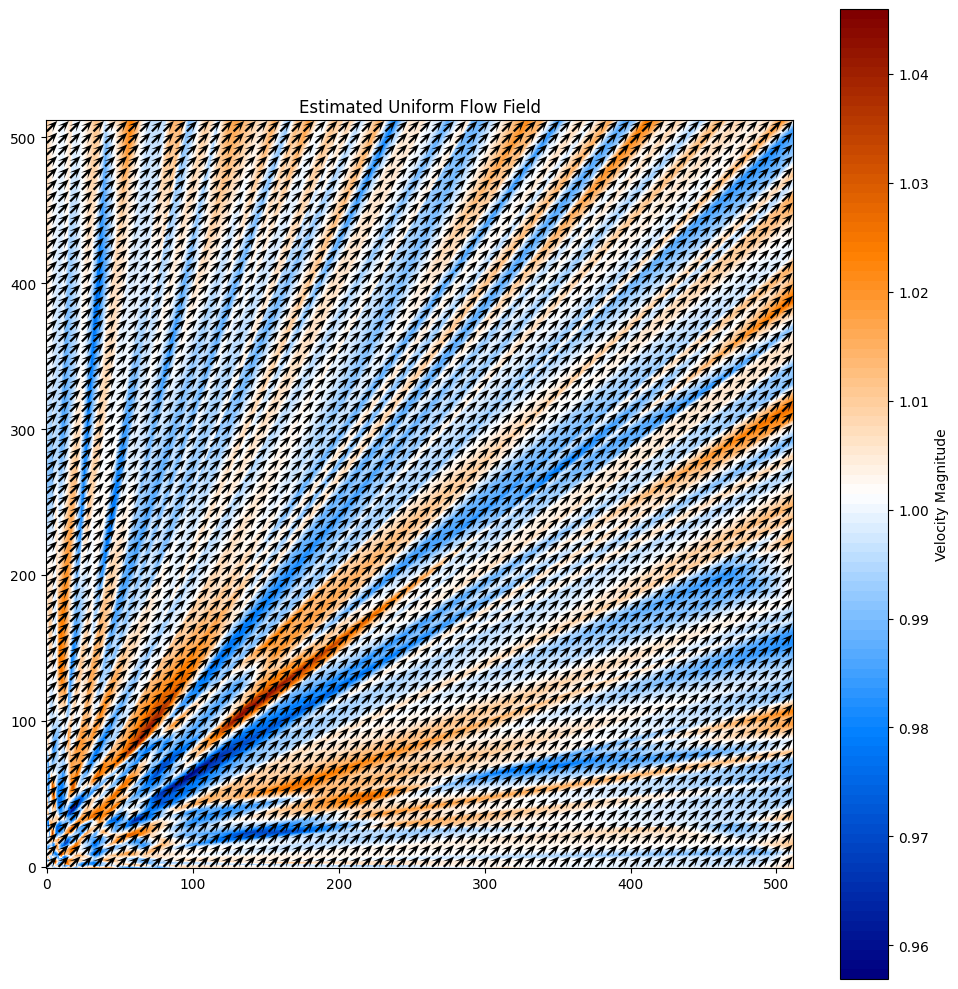

In [23]:
estimated_uniform_flow = estimated_uniform_flow_tensor.detach().cpu().numpy()
plot_flow_field(estimated_uniform_flow, SIZE // 8, "Estimated Uniform Flow Field")

In [24]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126).to(device)
estimated_uniform_flow_tensor_ff = fit_flow_field(ode, uniform_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 0.14960318803787231
Epoch 100, Loss: 0.0015401060227304697
Epoch 200, Loss: 0.0006495898705907166
Epoch 300, Loss: 0.0006744033889845014
Epoch 400, Loss: 0.0003301321994513273
Epoch 500, Loss: 0.0003739667881745845
Epoch 600, Loss: 0.00021255422325339168
Epoch 700, Loss: 0.00020984288130421191
Epoch 800, Loss: 0.00016964654787443578
Epoch 900, Loss: 0.0001556065253680572
Epoch 1000, Loss: 0.00014463523984886706
Epoch 2000, Loss: 9.135741856880486e-05
Epoch 3000, Loss: 7.162139809224755e-05
Epoch 4000, Loss: 6.228778511285782e-05
Epoch 5000, Loss: 5.738418985856697e-05
Epoch 6000, Loss: 5.476361184264533e-05
Epoch 7000, Loss: 5.3374344133771956e-05
Epoch 8000, Loss: 5.2665949624497443e-05
Epoch 9000, Loss: 5.232180410530418e-05
Epoch 10000, Loss: 5.216327554080635e-05


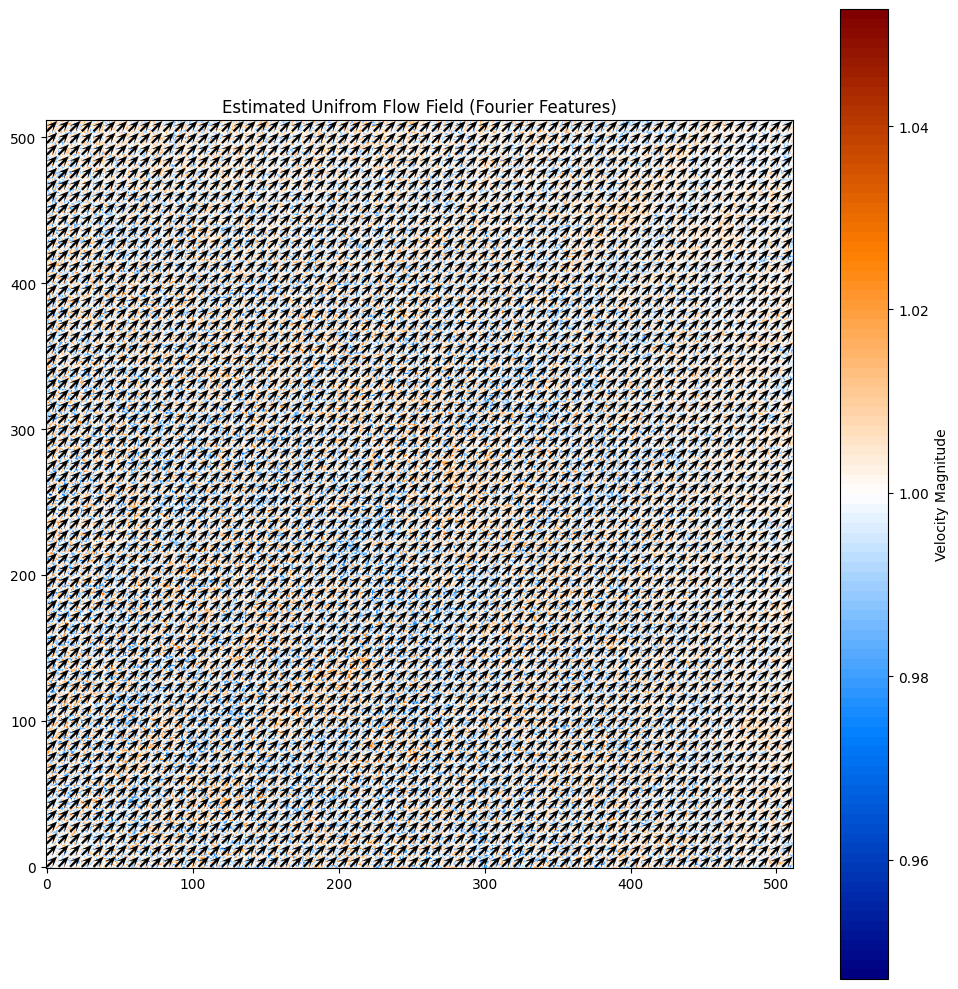

In [25]:
estimated_uniform_flow_ff = estimated_uniform_flow_tensor_ff.detach().cpu().numpy()
plot_flow_field(estimated_uniform_flow_ff, SIZE // 8, "Estimated Unifrom Flow Field (Fourier Features)")